# Creating models to predict MLB All-Stars

We will be attempting to use Decision Trees to see if we can create a model that can predict MLB All-Stars. The scope of this investigation will only concern position players, since position players and pitchers are selected differently. We will use 2015 because the rise of two-way players (pitchers and batters) in MLB after 2017 mean that some advanced statistics have not been updated to properly account for performance.

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

We begin by importing the necessary libraries to allow to create and display the models.

* pandas - Allows us to store the data being used
* sklearn.tree - Allows us to create the model
* matplotlib.pyplot - Allows us to plot data and model results

In [2]:
allStars = pd.read_csv('data/2015allStars.csv')
allStars

,Position,Starter,Team,All-Star Appearance
0,C,Salvador Perez,Kansas City Royals,3
1,1B,Miguel Cabrera,Detroit Tigers,10
2,2B,Jose Altuve,Houston Astros,3
3,3B,Josh Donaldson,Toronto Blue Jays,2
4,SS,Alcides Escobar,Kansas City Royals,1
5,OF,Mike Trout,Los Angeles Angels,4
6,OF,Lorenzo Cain,Kansas City Royals,1
7,OF,Alex Gordon,Kansas City Royals,3
8,DH,Nelson Cruz,Seattle Mariners,4
9,C,Russell Martin,Toronto Blue Jays,4


2015allStars.csv was created using data from https://bleacherreport.com/articles/2518737-2015-mlb-all-star-roster-complete-al-nl-lineups-and-game-schedule, omitting pithchers. This file will be used to cross reference the batting stats and create a field to mark all stars.

In [3]:
batting = pd.read_csv('data/2015batting.csv')
advancedBatting = pd.read_csv('data/2015advancedBatting.csv')

We import csv files for batting statistics. The batting dataframe will store counting stats (raw statistical data), while advancedBatting will store advanced statistics derived from batting. Both were sourced from BaseballReference.

In [4]:
batting

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,...,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,NL,30,1,1,0,0,...,0.000,-100.0,0,0,0,0,0,0,1,aardsda01
1,2,Fernando Abad*,29,OAK,AL,4,0,0,0,0,...,NaN,NaN,0,0,0,0,0,0,1,abadfe01
2,3,José Abreu,28,CHW,AL,154,668,613,88,178,...,0.850,135.0,308,16,15,0,1,11,*3D,abreujo02
3,4,A.J. Achter,26,MIN,AL,1,0,0,0,0,...,NaN,NaN,0,0,0,0,0,0,1,achteaj01
4,5,Dustin Ackley*,27,TOT,AL,108,264,238,28,55,...,0.712,96.0,102,3,1,3,4,0,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,1494,Jordan Zimmermann,29,WSN,NL,31,69,63,4,10,...,0.333,-9.0,11,0,0,6,0,0,1,zimmejo02
1494,1495,Ben Zobrist#,34,TOT,AL,126,535,467,76,129,...,0.809,121.0,210,8,1,0,5,3,47/D95H,zobribe01
1495,1496,Ben Zobrist#,34,OAK,AL,67,271,235,39,63,...,0.801,122.0,105,5,0,0,3,2,47/DH9,zobribe01
1496,1497,Ben Zobrist#,34,KCR,AL,59,264,232,37,66,...,0.816,120.0,105,3,1,0,2,1,47/5D9,zobribe01


In [5]:
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,NaN,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,$1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,$8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,NaN,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,$2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,$16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,0,NaN,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,$7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,$523500,Amateur Draft,*2/H,zuninmi01


Both files contain NaN fields, which need to be filled. Additionally, the Salary field in advancedBatting has dollar signs which need to be removed so that the field can be used for model creation.

In [50]:
advancedBatting = advancedBatting.fillna(0)

In [33]:
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,$1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,$8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,$2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,$16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,$7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,$523500,Amateur Draft,*2/H,zuninmi01


In [12]:
advancedBatting.loc[advancedBatting['Salary'] == 0, 'Salary'] = 507500 * (advancedBatting['G']/162)

In [13]:
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,93981.481481,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,$1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,$8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,3132.716049,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,$2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,$16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0.0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,$7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,$523500,Amateur Draft,*2/H,zuninmi01


In [34]:
advancedBatting.loc[advancedBatting['Name'] == 'Mike Zunino','Salary'].dtype == 'O'

True

In [35]:
advancedBatting['Salary'] = advancedBatting['Salary'].astype(str)
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,$1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,$8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,$2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,$16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,$7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,$523500,Amateur Draft,*2/H,zuninmi01


In [37]:
advancedBatting.loc[advancedBatting['Name'] == 'Mike Zunino','Salary'].dtype == 'I'

False

In [47]:
advancedBatting = pd.read_csv('data/2015advancedBatting.csv')
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,NaN,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,$1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,$8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,NaN,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,$2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,$16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,0,NaN,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,$7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,$523500,Amateur Draft,*2/H,zuninmi01


In [48]:
advancedBatting['Salary'] = advancedBatting['Salary'].str.replace('$','')
advancedBatting['Salary']

/var/folders/b7/hbtzj39j4tng96ln0jphxwzr0000gn/T/ipykernel_77491/1619755144.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  advancedBatting['Salary'] = advancedBatting['Salary'].str.replace('$','')


0            NaN
1        1087500
2        8666000
3            NaN
4        2600000
          ...   
1343    16500000
1344         NaN
1345     7500000
1346      523500
1347         NaN
Name: Salary, Length: 1348, dtype: object

We remove the dollar signs by replacing it with a empty string.

In [51]:
advancedBatting['Salary'] = advancedBatting['Salary'].astype(int)
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,523500,Amateur Draft,*2/H,zuninmi01


We set the salary field to int to make the data uniform.

In [55]:
advancedBatting.loc[advancedBatting['Name'] == 'Mike Zunino','Salary'] > 50000
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,0,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,523500,Amateur Draft,*2/H,zuninmi01


In [56]:
advancedBatting.loc[advancedBatting['Salary'] == 0, 'Salary'] = 507500 * (advancedBatting['G']/162)
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,9.398148e+04,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,1.087500e+06,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,8.666000e+06,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,3.132716e+03,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,2.600000e+06,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,1.650000e+07,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0.000000e+00,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,7.500000e+06,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,5.235000e+05,Amateur Draft,*2/H,zuninmi01


We then go through the Salary field and update the empty fields to be the league minimum in 2015 ($507,500) pro-rated to the amount of games they appeared in, as this is how they are usually paid.

In [57]:
advancedBatting['Salary'] = advancedBatting['Salary'].astype('int64')
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,93981,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,3132,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,523500,Amateur Draft,*2/H,zuninmi01


We set the type of 'Salary' to int64 so that we get plain numbers.

In [58]:
advancedBatting['Pos Summary'] = advancedBatting['Pos Summary'].astype(str)
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,93981,Free Agency,1,aardsda01
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,1087500,Traded,1,abadfe01
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,...,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,...,0.0,0.500,0.500,0.0,0.0,0,3132,Amateur Draft,1,achteaj01
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,...,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1343,1344,Jordan Zimmermann,29,WSN,31,69,-10,0,0,0,...,-0.1,0.498,0.500,-0.1,0.0,-1,16500000,Amateur Draft,1,zimmejo02
1344,1345,Barry Zito*,37,OAK,0,0,0,0,0,0,...,0.0,0.000,0.000,0.0,0.0,0,0,Free Agency,/1,zitoba01
1345,1346,Ben Zobrist#,34,2TM,126,535,13,-1,1,-8,...,2.4,0.504,0.501,3.2,-0.8,31,7500000,Traded,47/D95H,zobribe01
1346,1347,Mike Zunino,24,SEA,112,386,-25,0,0,-1,...,-0.7,0.481,0.487,-0.6,0.7,-5,523500,Amateur Draft,*2/H,zuninmi01


We set 'Pos Summary' to string so that the data type in the field is uniform.

In [62]:
advancedBatting.loc[advancedBatting['Name'] == 'Mike Zunino','Pos Summary'].dtype == advancedBatting.loc[advancedBatting['Name'] == 'Tony Zych','Pos Summary'].dtype

True

In [63]:
advancedBatting.loc[advancedBatting['Name'] == 'Jose Altuve','Pos Summary']

24    *4/D
Name: Pos Summary, dtype: object

In [65]:
allStarSet = set(allStars['Starter'].tolist())

In [66]:
allStarSet

{'A.J. Pollock',
 'Adam Jones',
 'Adrian Gonzalez',
 'Albert Pujols',
 'Alcides Escobar',
 'Alex Gordon',
 'Andrew McCutchen',
 'Anthony Rizzo',
 'Brandon Crawford',
 'Brock Holt',
 'Bryce Harper',
 'Buster Posey',
 'DJ LeMahieu',
 'Dee Gordon',
 'Giancarlo Stanton',
 'J.D. Martinez',
 'Jason Kipnis',
 'Jhonny Peralta',
 'Joc Pederson',
 'Joe Panik',
 'Jose Altuve',
 'Jose Bautista',
 'Jose Iglesias',
 'Josh Donaldson',
 'Justin Upton',
 'Kris Bryant',
 'Lorenzo Cain',
 'Manny Machado',
 'Mark Teixeira',
 'Matt Holliday',
 'Miguel Cabrera',
 'Mike Trout',
 'Nelson Cruz',
 'Nolan Arenado',
 'Paul Goldschmidt',
 'Prince Fielder',
 'Russell Martin',
 'Salvador Perez',
 'Stephen Vogt',
 'Todd Frazier',
 'Yadier Molina',
 'Yasmani Grandal'}

We will create the set used to cross-reference the stats dataframes by using the 'Name' field.

In [68]:
def checkAllStar(name):
    return name[:-1] in allStarSet if name[-1] in {'*','#','+'} else name in allStarSet

In [69]:
advancedBatting['isAllStar'] = advancedBatting['Name'].apply(checkAllStar)

In [71]:
advancedBatting.loc[advancedBatting['Name'] == 'Jose Altuve']

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,...,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional,isAllStar
24,25,Jose Altuve,25,HOU,154,689,19,-4,-1,-5,...,0.51,0.509,4.5,0.1,42,2500000,Amateur Free Agent,*4/D,altuvjo01,True


We create a function called checkAllStar and apply it to advancedBatting to create a field to mark All-Stars. The function is applied to each series and checks if the name is present in allStarSet. The function allows us to check for players who have special characters by omitting the last character.

In [74]:
batting = batting.fillna(0)
batting

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,...,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional
0,1,David Aardsma,33,ATL,NL,30,1,1,0,0,...,0.000,-100.0,0,0,0,0,0,0,1,aardsda01
1,2,Fernando Abad*,29,OAK,AL,4,0,0,0,0,...,0.000,0.0,0,0,0,0,0,0,1,abadfe01
2,3,José Abreu,28,CHW,AL,154,668,613,88,178,...,0.850,135.0,308,16,15,0,1,11,*3D,abreujo02
3,4,A.J. Achter,26,MIN,AL,1,0,0,0,0,...,0.000,0.0,0,0,0,0,0,0,1,achteaj01
4,5,Dustin Ackley*,27,TOT,AL,108,264,238,28,55,...,0.712,96.0,102,3,1,3,4,0,7H84/3D9,ackledu01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,1494,Jordan Zimmermann,29,WSN,NL,31,69,63,4,10,...,0.333,-9.0,11,0,0,6,0,0,1,zimmejo02
1494,1495,Ben Zobrist#,34,TOT,AL,126,535,467,76,129,...,0.809,121.0,210,8,1,0,5,3,47/D95H,zobribe01
1495,1496,Ben Zobrist#,34,OAK,AL,67,271,235,39,63,...,0.801,122.0,105,5,0,0,3,2,47/DH9,zobribe01
1496,1497,Ben Zobrist#,34,KCR,AL,59,264,232,37,66,...,0.816,120.0,105,3,1,0,2,1,47/5D9,zobribe01


In [75]:
batting['isAllStar'] = batting['Name'].apply(checkAllStar)
batting

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,...,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional,isAllStar
0,1,David Aardsma,33,ATL,NL,30,1,1,0,0,...,-100.0,0,0,0,0,0,0,1,aardsda01,False
1,2,Fernando Abad*,29,OAK,AL,4,0,0,0,0,...,0.0,0,0,0,0,0,0,1,abadfe01,False
2,3,José Abreu,28,CHW,AL,154,668,613,88,178,...,135.0,308,16,15,0,1,11,*3D,abreujo02,False
3,4,A.J. Achter,26,MIN,AL,1,0,0,0,0,...,0.0,0,0,0,0,0,0,1,achteaj01,False
4,5,Dustin Ackley*,27,TOT,AL,108,264,238,28,55,...,96.0,102,3,1,3,4,0,7H84/3D9,ackledu01,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,1494,Jordan Zimmermann,29,WSN,NL,31,69,63,4,10,...,-9.0,11,0,0,6,0,0,1,zimmejo02,False
1494,1495,Ben Zobrist#,34,TOT,AL,126,535,467,76,129,...,121.0,210,8,1,0,5,3,47/D95H,zobribe01,False
1495,1496,Ben Zobrist#,34,OAK,AL,67,271,235,39,63,...,122.0,105,5,0,0,3,2,47/DH9,zobribe01,False
1496,1497,Ben Zobrist#,34,KCR,AL,59,264,232,37,66,...,120.0,105,3,1,0,2,1,47/5D9,zobribe01,False


In [76]:
batting.loc[batting['Name'] == 'Jose Altuve']

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,...,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional,isAllStar
25,26,Jose Altuve,25,HOU,AL,154,689,638,86,200,...,125.0,293,17,9,3,6,8,*4/D,altuvjo01,True


The batting dataframe is easier to sanitise, as we can just apply the checkAllStar function and fill the blanks.

In [80]:
import seaborn as sns
from seaborn import heatmap

/var/folders/b7/hbtzj39j4tng96ln0jphxwzr0000gn/T/ipykernel_77491/2086631333.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  batCorr = batting.corr()


<Axes: title={'center': 'Standard Batting Correlation Heatmap'}>

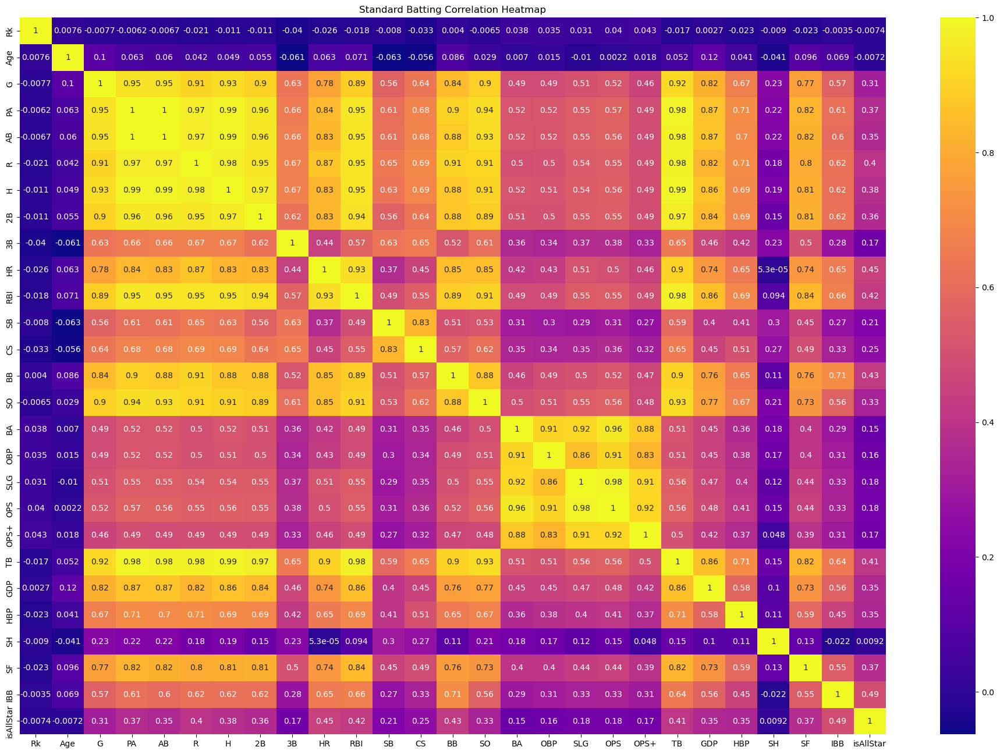

In [86]:
batCorr = batting.corr()
plt.figure(figsize=(24,16))
plt.title('Standard Batting Correlation Heatmap')
sns.heatmap(batCorr,cmap='plasma',annot=True)

/var/folders/b7/hbtzj39j4tng96ln0jphxwzr0000gn/T/ipykernel_77491/2715560288.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  advBatCorr = advancedBatting.corr()


<Axes: title={'center': 'Advanced Batting Correlation Heatmap'}>

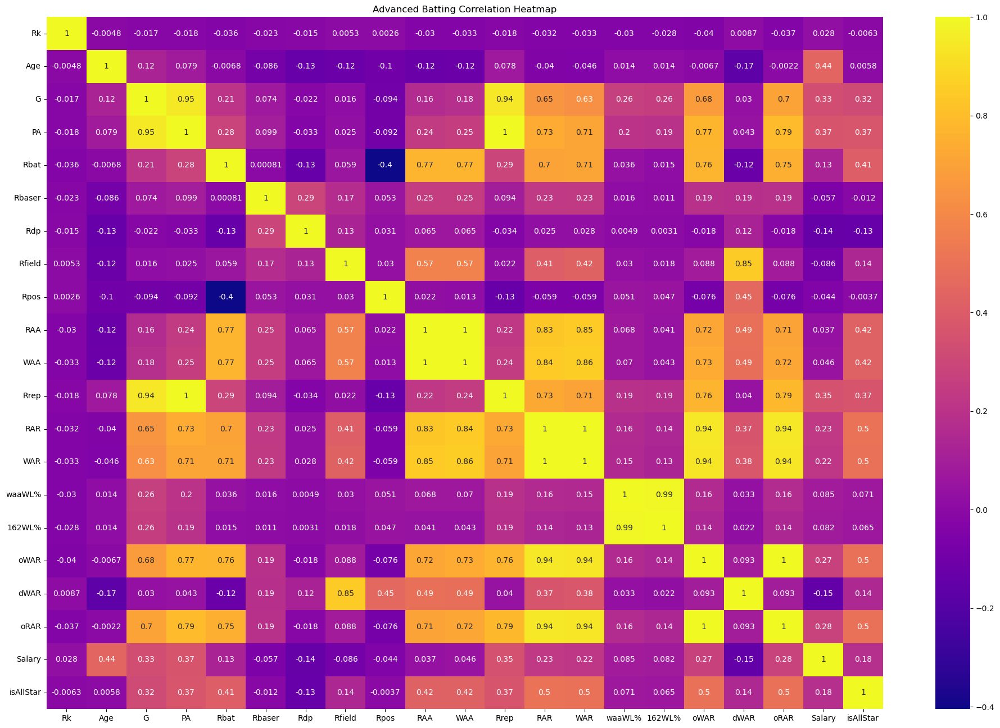

In [87]:
advBatCorr = advancedBatting.corr()
plt.figure(figsize=(24,16))
plt.title('Advanced Batting Correlation Heatmap')
sns.heatmap(advBatCorr,cmap='plasma',annot=True)

By importing seaborn, we can create a heatmap to allow us to see if there are certain fields that correlate more strongly to a player being an All-Star. We can immediately see that stats such as IBB (Intentional Walks) in batting and RAA (Runs Above Average), RAR (Runs Above Replacement), WAR (Wins Above Replacement) and their offensive components oRAR and oWAR correlate the most strongly.

In [88]:
batting.to_string()

"        Rk                    Name  Age   Tm   Lg    G   PA   AB    R    H  2B  3B  HR  RBI  SB  CS   BB   SO     BA    OBP    SLG    OPS   OPS+   TB  GDP  HBP  SH  SF  IBB Pos Summary Name-additional  isAllStar\n0        1           David Aardsma   33  ATL   NL   30    1    1    0    0   0   0   0    0   0   0    0    1  0.000  0.000  0.000  0.000 -100.0    0    0    0   0   0    0           1       aardsda01      False\n1        2          Fernando Abad*   29  OAK   AL    4    0    0    0    0   0   0   0    0   0   0    0    0  0.000  0.000  0.000  0.000    0.0    0    0    0   0   0    0           1        abadfe01      False\n2        3              José Abreu   28  CHW   AL  154  668  613   88  178  34   3  30  101   0   0   39  140  0.290  0.347  0.502  0.850  135.0  308   16   15   0   1   11         *3D       abreujo02      False\n3        4             A.J. Achter   26  MIN   AL    1    0    0    0    0   0   0   0    0   0   0    0    0  0.000  0.000  0.000  0.000    0.0   

In [90]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [91]:
batting

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,BA,OBP,SLG,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional,isAllStar
0,1,David Aardsma,33,ATL,NL,30,1,1,0,0,0,0,0,0,0,0,0,1,0.000,0.000,0.000,0.000,-100.0,0,0,0,0,0,0,1,aardsda01,False
1,2,Fernando Abad*,29,OAK,AL,4,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,abadfe01,False
2,3,José Abreu,28,CHW,AL,154,668,613,88,178,34,3,30,101,0,0,39,140,0.290,0.347,0.502,0.850,135.0,308,16,15,0,1,11,*3D,abreujo02,False
3,4,A.J. Achter,26,MIN,AL,1,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,achteaj01,False
4,5,Dustin Ackley*,27,TOT,AL,108,264,238,28,55,11,3,10,30,2,2,18,45,0.231,0.284,0.429,0.712,96.0,102,3,1,3,4,0,7H84/3D9,ackledu01,False
5,6,Dustin Ackley*,27,SEA,AL,85,207,186,22,40,8,1,6,19,2,2,14,38,0.215,0.270,0.366,0.635,77.0,68,3,1,3,3,0,78H/D94,ackledu01,False
6,7,Dustin Ackley*,27,NYY,AL,23,57,52,6,15,3,2,4,11,0,0,4,7,0.288,0.333,0.654,0.987,162.0,34,0,0,0,1,0,/4H37D,ackledu01,False
7,8,Cristhian Adames#,23,COL,NL,26,58,53,4,13,1,1,0,3,0,1,3,11,0.245,0.298,0.302,0.600,55.0,16,0,1,1,0,1,6H/4,adamecr01,False
8,9,Austin Adams,28,CLE,AL,3,1,1,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,-100.0,0,1,0,0,0,0,1,adamsau01,False
9,10,Matt Adams*,26,STL,NL,60,186,175,14,42,9,0,5,24,1,0,10,41,0.240,0.280,0.377,0.657,78.0,66,1,0,0,1,1,3H,adamsma01,False


In [103]:
features = ["Age","G","PA","AB","R","H","2B","3B","HR","RBI","SB","CS","BB","SO","BA","OBP","SLG","OPS","OPS+","TB","GDP","HBP","SH","SF","IBB"]
X1 = batting[features]
y1 = batting['isAllStar']


In [104]:
X1

,Age,G,PA,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,BA,OBP,SLG,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB
0,33,30,1,1,0,0,0,0,0,0,0,0,0,1,0.000,0.000,0.000,0.000,-100.0,0,0,0,0,0,0
1,29,4,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0
2,28,154,668,613,88,178,34,3,30,101,0,0,39,140,0.290,0.347,0.502,0.850,135.0,308,16,15,0,1,11
3,26,1,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0
4,27,108,264,238,28,55,11,3,10,30,2,2,18,45,0.231,0.284,0.429,0.712,96.0,102,3,1,3,4,0
5,27,85,207,186,22,40,8,1,6,19,2,2,14,38,0.215,0.270,0.366,0.635,77.0,68,3,1,3,3,0
6,27,23,57,52,6,15,3,2,4,11,0,0,4,7,0.288,0.333,0.654,0.987,162.0,34,0,0,0,1,0
7,23,26,58,53,4,13,1,1,0,3,0,1,3,11,0.245,0.298,0.302,0.600,55.0,16,0,1,1,0,1
8,28,3,1,1,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,-100.0,0,1,0,0,0,0
9,26,60,186,175,14,42,9,0,5,24,1,0,10,41,0.240,0.280,0.377,0.657,78.0,66,1,0,0,1,1


Not all fields can be used for modelling, so we must create a subset of fields to use as the features of the model, while 'isAllStar' will be used as the target. X1 is a simulation of how the feature set may look like.

In [95]:
from sklearn.utils import shuffle
shuffledBatting = shuffle(batting)

In [96]:
shuffledBatting

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,BA,OBP,SLG,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional,isAllStar
173,174,Emmanuel Burriss#,30,WSN,NL,5,5,3,2,2,0,0,0,0,0,0,2,0,0.667,0.800,0.667,1.467,306.0,2,0,0,0,0,0,/H4,burriem01,False
940,941,Mike Napoli,33,TOT,AL,133,469,407,46,91,20,1,18,50,3,3,57,118,0.224,0.324,0.410,0.734,96.0,167,11,4,0,1,3,*3H7/D,napolmi01,False
138,139,Brad Brach,29,BAL,AL,5,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,brachbr01,False
881,882,Mark Melancon,30,PIT,NL,72,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,melanma01,False
809,810,Jean Machi,33,TOT,MLB,36,3,3,0,0,0,0,0,0,0,0,0,2,0.000,0.000,0.000,0.000,-100.0,0,0,0,0,0,0,1,machije01,False
151,152,Mike Broadway,28,SFG,NL,21,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,broadmi01,False
664,665,Paul Janish,32,BAL,AL,14,36,35,4,10,3,0,0,3,0,0,0,3,0.286,0.278,0.371,0.649,76.0,13,0,0,0,1,0,6/4H,janispa01,False
583,584,Marcus Hatley,27,STL,NL,2,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,/1,hatlema01,False
1150,1151,Donn Roach,25,CHC,NL,1,1,1,0,1,0,0,0,1,0,0,0,0,1.000,1.000,1.000,2.000,457.0,1,0,0,0,0,0,/1,roachdo01,False
905,906,Franklin Morales*,29,KCR,AL,5,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,moralfr01,False


By importing sklearn.utils.shuffle, we can shuffle our dataset. However, we can use pandas' sample function to get a shuffled sample of the dataframe.

In [99]:
sampledBatting = batting.sample(frac=0.75)
sampledBatting

,Rk,Name,Age,Tm,Lg,G,PA,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,BA,OBP,SLG,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB,Pos Summary,Name-additional,isAllStar
499,500,Jonny Gomes,34,KCR,AL,12,34,30,2,5,2,0,0,4,0,0,3,14,0.167,0.235,0.233,0.469,28.0,7,1,0,0,1,0,/9DH,gomesjo01,False
921,922,Brandon Moss*,31,CLE,AL,94,375,337,36,73,17,1,15,50,0,0,32,106,0.217,0.288,0.407,0.695,84.0,137,9,3,0,3,2,93/DH,mossbr01,False
606,607,Elian Herrera#,30,MIL,NL,83,277,256,29,62,18,0,7,33,3,1,18,72,0.242,0.290,0.395,0.684,86.0,101,4,0,1,2,1,54H/97,herreel01,False
1149,1150,Anthony Rizzo*,25,CHC,NL,160,701,586,94,163,38,3,31,101,17,6,78,105,0.278,0.387,0.512,0.899,146.0,300,9,30,0,7,9,*3,rizzoan01,True
1160,1161,Fernando Rodney,38,TOT,MLB,21,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,rodnefe01,False
276,277,Michael Conforto*,22,NYM,NL,56,194,174,30,47,14,0,9,26,0,1,17,39,0.270,0.335,0.506,0.841,130.0,88,4,1,0,2,0,7/H,confomi01,False
835,836,Carlos Martinez,23,STL,NL,31,63,56,2,8,2,0,0,0,0,0,1,23,0.143,0.172,0.179,0.351,-4.0,10,1,1,5,0,0,1/H,martica04,False
538,539,Jason Grilli,38,ATL,NL,33,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,grillja01,False
418,419,Prince Fielder*,31,TEX,AL,158,693,613,78,187,28,0,23,98,0,0,64,88,0.305,0.378,0.463,0.841,126.0,284,21,11,0,5,14,*D3/H,fieldpr01,True
451,452,Ernesto Frieri,29,TBR,AL,2,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0,1,frierer01,False


In [105]:
X2 = sampledBatting[features]
y2 = sampledBatting['isAllStar']

In [106]:
X2

,Age,G,PA,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,BA,OBP,SLG,OPS,OPS+,TB,GDP,HBP,SH,SF,IBB
499,34,12,34,30,2,5,2,0,0,4,0,0,3,14,0.167,0.235,0.233,0.469,28.0,7,1,0,0,1,0
921,31,94,375,337,36,73,17,1,15,50,0,0,32,106,0.217,0.288,0.407,0.695,84.0,137,9,3,0,3,2
606,30,83,277,256,29,62,18,0,7,33,3,1,18,72,0.242,0.290,0.395,0.684,86.0,101,4,0,1,2,1
1149,25,160,701,586,94,163,38,3,31,101,17,6,78,105,0.278,0.387,0.512,0.899,146.0,300,9,30,0,7,9
1160,38,21,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0
276,22,56,194,174,30,47,14,0,9,26,0,1,17,39,0.270,0.335,0.506,0.841,130.0,88,4,1,0,2,0
835,23,31,63,56,2,8,2,0,0,0,0,0,1,23,0.143,0.172,0.179,0.351,-4.0,10,1,1,5,0,0
538,38,33,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0
418,31,158,693,613,78,187,28,0,23,98,0,0,64,88,0.305,0.378,0.463,0.841,126.0,284,21,11,0,5,14
451,29,2,0,0,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.0,0,0,0,0,0,0


In [107]:
y2

499     False
921     False
606     False
1149     True
1160    False
276     False
835     False
538     False
418      True
451     False
312     False
1294    False
828     False
988     False
885     False
607     False
1228    False
1429     True
878     False
972     False
687     False
223     False
1054    False
1287    False
68      False
479     False
389     False
115     False
626      True
1202    False
303     False
54      False
935     False
633     False
1457    False
1305    False
659     False
166     False
912     False
292     False
642     False
1046    False
1077    False
226     False
1059    False
175     False
667     False
1192    False
1174    False
653     False
1470    False
1073    False
1063    False
359     False
289     False
1350    False
46      False
630     False
572     False
854     False
769     False
254     False
870     False
1416    False
220     False
796     False
356     False
764     False
1396    False
406     False
879     False
1254  

We can use sample and our features array to get X2 and y2 that we can feed into the decision tree.

In [109]:
simpleBattingTree = DecisionTreeClassifier()
simpleBattingTree = simpleBattingTree.fit(X2,y2)

In [111]:
from sklearn import tree

[Text(0.5509259259259259, 0.95, 'IBB <= 5.5\ngini = 0.052\nsamples = 1124\nvalue = [1094, 30]'),
 Text(0.37962962962962965, 0.85, 'HR <= 25.5\ngini = 0.024\nsamples = 1088\nvalue = [1075, 13]'),
 Text(0.2037037037037037, 0.75, 'H <= 118.5\ngini = 0.015\nsamples = 1078\nvalue = [1070, 8]'),
 Text(0.07407407407407407, 0.65, 'IBB <= 4.5\ngini = 0.002\nsamples = 1014\nvalue = [1013, 1]'),
 Text(0.037037037037037035, 0.55, 'gini = 0.0\nsamples = 1003\nvalue = [1003, 0]'),
 Text(0.1111111111111111, 0.55, 'Age <= 33.0\ngini = 0.165\nsamples = 11\nvalue = [10, 1]'),
 Text(0.07407407407407407, 0.45, 'gini = 0.0\nsamples = 10\nvalue = [10, 0]'),
 Text(0.14814814814814814, 0.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.3333333333333333, 0.65, 'TB <= 174.5\ngini = 0.195\nsamples = 64\nvalue = [57, 7]'),
 Text(0.25925925925925924, 0.55, 'TB <= 170.5\ngini = 0.5\nsamples = 6\nvalue = [3, 3]'),
 Text(0.2222222222222222, 0.45, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]'),
 Text(0.296296296296

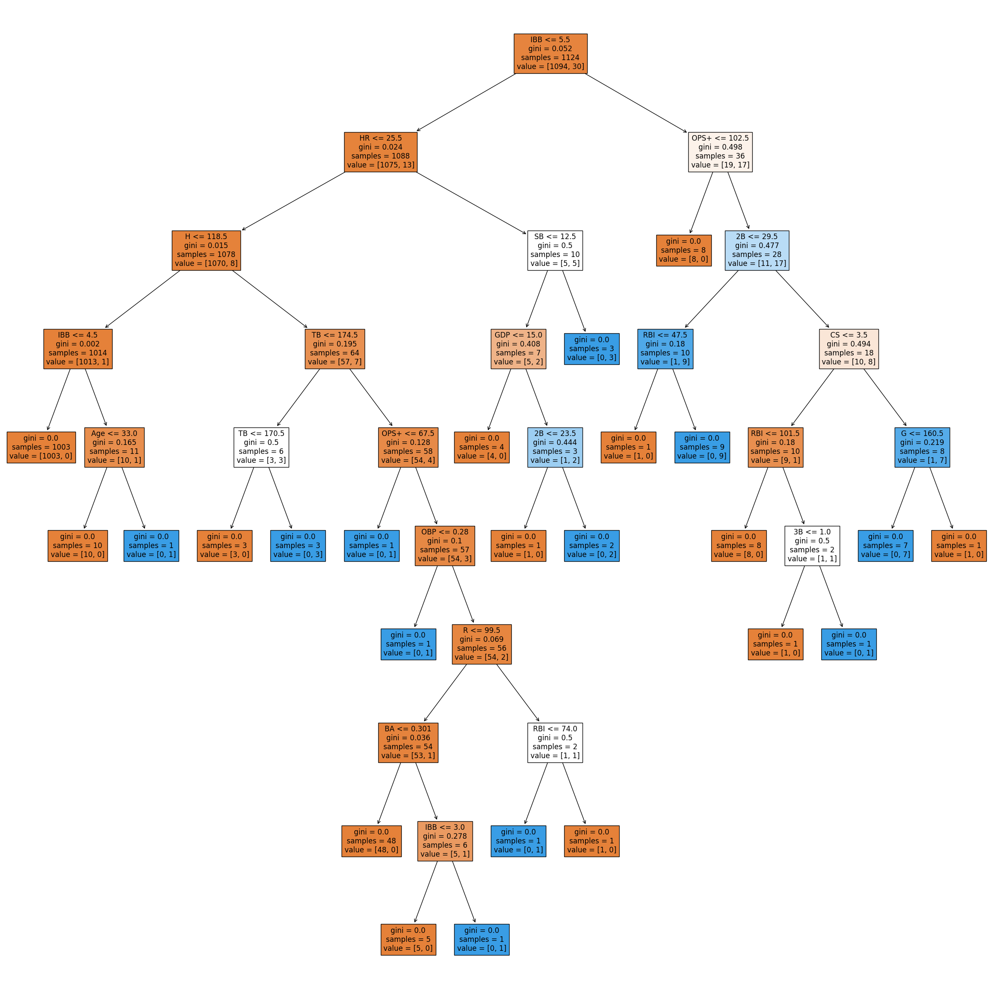

In [116]:
plt.figure(figsize=(30,30))
tree.plot_tree(simpleBattingTree,feature_names = features, filled=True)

By creating the decision tree and fitting our training data to it we can see the metrics by which our model will predict new data.

The decision tree will continue splitting until all the samples at a decision point have the same value.

In [117]:
advancedBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,Rpos,RAA,WAA,Rrep,RAR,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional,isAllStar
0,1,David Aardsma,33,ATL,30,1,0,0,0,0,0,0,0.0,0,0,0.0,0.500,0.500,0.0,0.0,0,93981,Free Agency,1,aardsda01,False
1,2,Fernando Abad*,29,OAK,4,0,0,0,0,0,0,0,0.0,0,0,0.0,0.500,0.500,0.0,0.0,0,1087500,Traded,1,abadfe01,False
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,-10,9,1.2,23,33,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02,False
3,4,A.J. Achter,26,MIN,1,0,0,0,0,0,0,0,0.0,0,0,0.0,0.500,0.500,0.0,0.0,0,3132,Amateur Draft,1,achteaj01,False
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,-3,-18,-1.9,9,-9,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01,False
5,6,Cristhian Adames#,23,COL,26,58,-3,-1,1,1,1,-1,-0.1,2,1,0.1,0.495,0.499,-0.1,0.2,0,81450,Amateur Free Agent,6H/4,adamecr01,False
6,7,Austin Adams,28,CLE,3,1,0,0,0,0,0,0,0.0,0,0,0.0,0.488,0.500,0.0,0.0,0,507700,Amateur Draft,1,adamsau01,False
7,8,Matt Adams*,26,STL,60,186,-6,-1,2,2,-2,-5,-0.6,6,1,0.0,0.491,0.497,-0.2,0.0,-1,534000,Amateur Draft,3H,adamsma01,False
8,9,Nathan Adcock,27,CIN,12,0,0,0,0,0,0,0,0.0,0,0,0.0,0.500,0.500,0.0,0.0,0,37592,Free Agency,1,adcocna01,False
9,10,Ehire Adrianza#,25,SFG,52,134,-6,0,0,3,2,-2,-0.3,4,2,0.2,0.495,0.499,-0.2,0.5,-1,162901,Amateur Free Agent,46H/35,adriaeh01,False


In [118]:
advFeatures = ["Age","G","PA","Rbat","Rbaser","Rdp","Rfield","Rpos","RAA","WAA","Rrep","RAR","WAR","waaWL%","162WL%","oWAR","dWAR","oRAR","Salary"]
sampledAdvBatting = advancedBatting.sample(frac=0.75)

X3 = sampledAdvBatting[advFeatures]
y3 = sampledAdvBatting['isAllStar']

In [119]:
advBattingTree = DecisionTreeClassifier()
advBattingTree.fit(X3,y3)

DecisionTreeClassifier()

[Text(0.5504032258064516, 0.9444444444444444, 'oRAR <= 27.5\ngini = 0.059\nsamples = 1011\nvalue = [980, 31]'),
 Text(0.3024193548387097, 0.8333333333333334, 'PA <= 655.0\ngini = 0.019\nsamples = 954\nvalue = [945, 9]'),
 Text(0.1532258064516129, 0.7222222222222222, 'Rdp <= -2.5\ngini = 0.013\nsamples = 946\nvalue = [940, 6]'),
 Text(0.06451612903225806, 0.6111111111111112, 'Rpos <= 4.5\ngini = 0.375\nsamples = 8\nvalue = [6, 2]'),
 Text(0.03225806451612903, 0.5, 'gini = 0.0\nsamples = 6\nvalue = [6, 0]'),
 Text(0.0967741935483871, 0.5, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(0.24193548387096775, 0.6111111111111112, 'Rbaser <= 3.5\ngini = 0.008\nsamples = 938\nvalue = [934, 4]'),
 Text(0.16129032258064516, 0.5, 'dWAR <= 1.75\ngini = 0.004\nsamples = 928\nvalue = [926, 2]'),
 Text(0.0967741935483871, 0.3888888888888889, 'Rbat <= 7.5\ngini = 0.002\nsamples = 922\nvalue = [921, 1]'),
 Text(0.06451612903225806, 0.2777777777777778, 'gini = 0.0\nsamples = 898\nvalue = [898, 0]'),
 

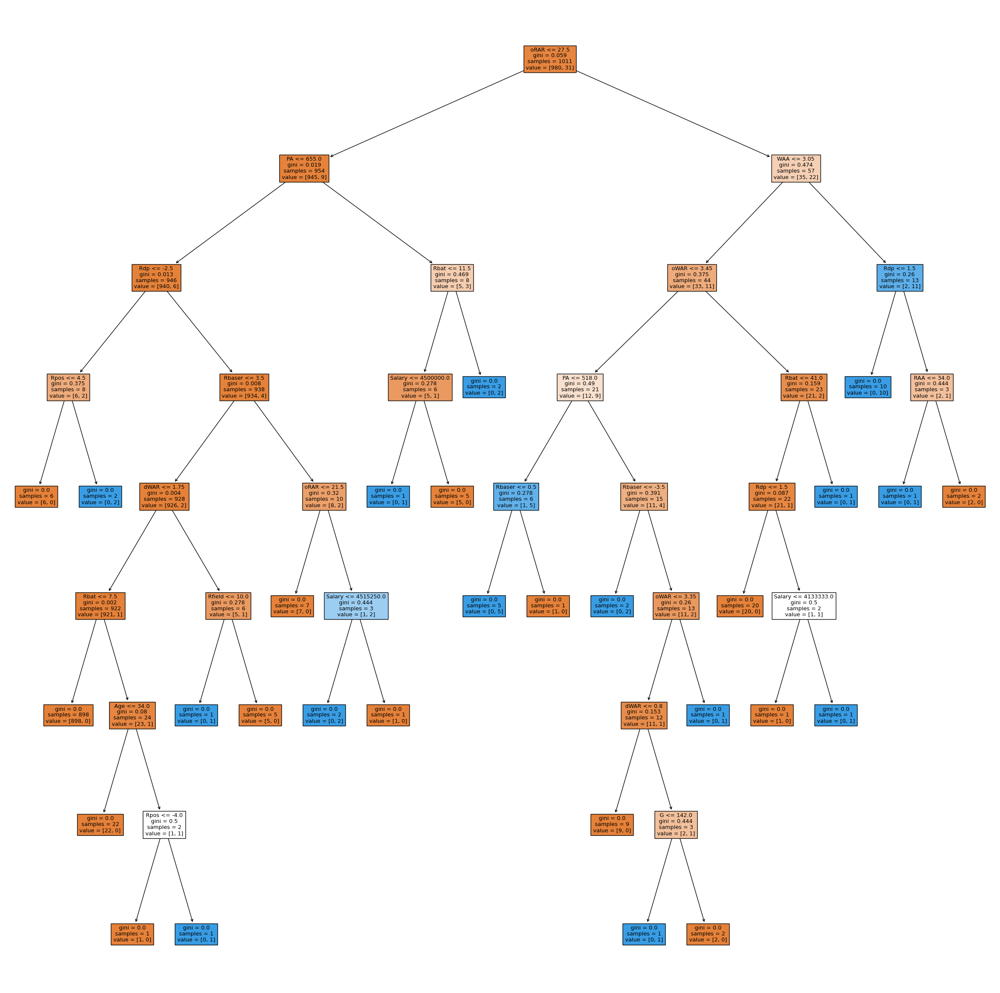

In [121]:
plt.figure(figsize=(30,30))
tree.plot_tree(advBattingTree,feature_names = advFeatures, filled=True)

We can repeat the same with advancedBatting to create a decision tree and compare it. By looking at the decision points, we can see that certain statistics split the data cleanly between labels.

Statistics such as Rbaser, Rdp and oRAR are more able to split the samples based on label, so it may be useful to create a decision with just these stats as features.

[Text(0.5696022727272727, 0.95, 'oRAR <= 27.5\ngini = 0.059\nsamples = 1011\nvalue = [980, 31]'),
 Text(0.29545454545454547, 0.85, 'Rbaser <= 3.5\ngini = 0.019\nsamples = 954\nvalue = [945, 9]'),
 Text(0.13636363636363635, 0.75, 'Rdp <= -2.5\ngini = 0.013\nsamples = 943\nvalue = [937, 6]'),
 Text(0.045454545454545456, 0.65, 'WAA <= -0.35\ngini = 0.375\nsamples = 8\nvalue = [6, 2]'),
 Text(0.022727272727272728, 0.55, 'gini = 0.0\nsamples = 5\nvalue = [5, 0]'),
 Text(0.06818181818181818, 0.55, 'oWAR <= 2.25\ngini = 0.444\nsamples = 3\nvalue = [1, 2]'),
 Text(0.045454545454545456, 0.45, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(0.09090909090909091, 0.45, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.22727272727272727, 0.65, 'oWAR <= 2.35\ngini = 0.009\nsamples = 935\nvalue = [931, 4]'),
 Text(0.1590909090909091, 0.55, 'oRAR <= 9.5\ngini = 0.004\nsamples = 915\nvalue = [913, 2]'),
 Text(0.13636363636363635, 0.45, 'gini = 0.0\nsamples = 822\nvalue = [822, 0]'),
 Text(0.1818181

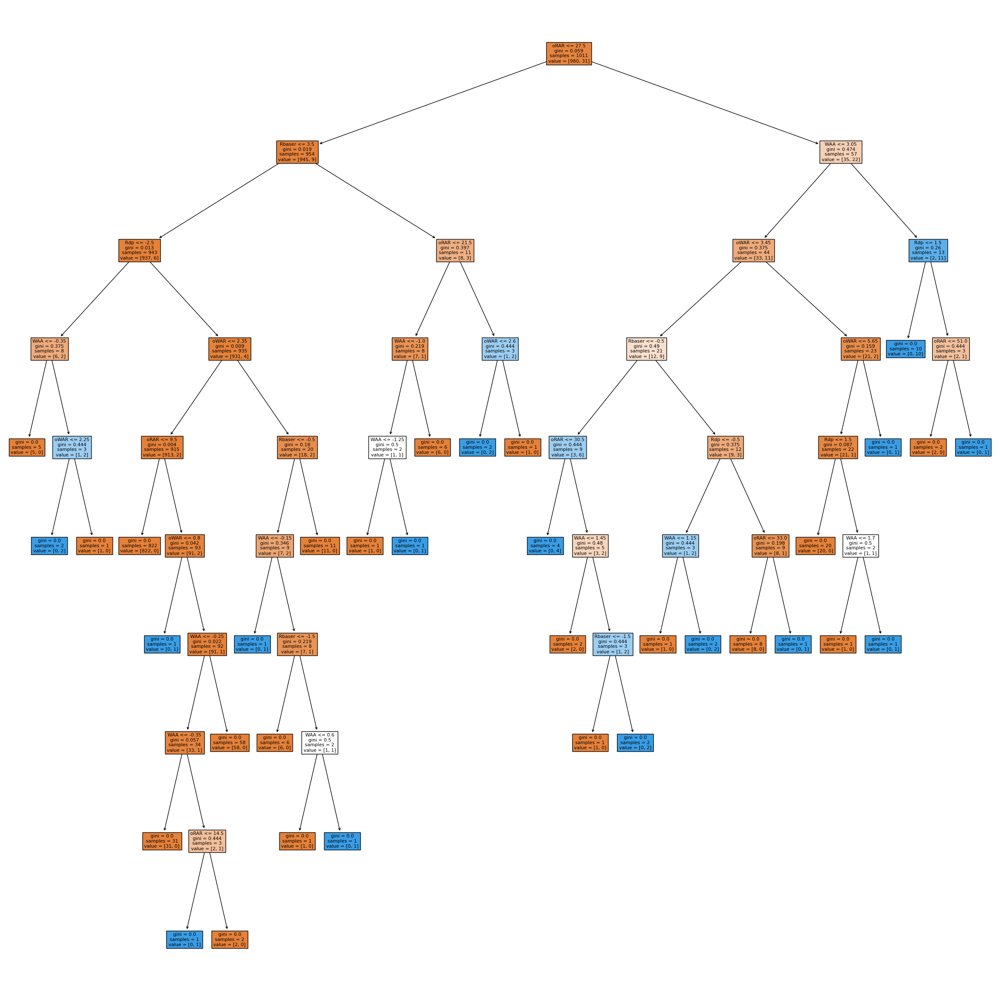

In [126]:
refinedAdvFeatures = ["oRAR","Rbaser","Rdp","oWAR","WAA"]

X4 = sampledAdvBatting[refinedAdvFeatures]
y4 = sampledAdvBatting['isAllStar']

refinedAdvBattingTree = DecisionTreeClassifier()
refinedAdvBattingTree.fit(X4,y4)

plt.figure(figsize=(30,30))
tree.plot_tree(refinedAdvBattingTree,feature_names = refinedAdvFeatures, filled=True)

We created a decision tree with just 5 features to see the tree that would be created, however, it seems to have made a decision tree with more decision points and a greater depth.

In [125]:
X4

,oRAR,Rbaser,Rdp,oWAR,WAA
79,0,0,0,0.0,0.0
52,0,0,0,0.0,0.0
594,18,-5,1,1.8,-0.3
390,2,0,0,0.2,0.2
871,0,0,0,0.0,0.0
688,27,1,3,2.8,-0.4
157,56,3,2,5.7,3.3
703,1,0,0,0.1,0.1
753,0,0,0,0.0,0.0
296,13,1,1,1.3,-0.5


In [127]:
y4

79      False
52      False
594     False
390     False
871     False
688     False
157      True
703     False
753     False
296     False
1109    False
559     False
510     False
1147    False
1196    False
1225    False
384     False
1170    False
657     False
321     False
1223    False
810     False
991     False
316     False
417     False
757      True
463     False
947     False
53      False
779     False
1295    False
448     False
1218    False
1226    False
465     False
1212    False
882     False
292     False
504     False
775     False
164     False
769     False
70      False
1122    False
14      False
369     False
264     False
349     False
847     False
1317    False
949     False
809     False
1076    False
155     False
250     False
156     False
165     False
807     False
139     False
283     False
772     False
332     False
739     False
75      False
1278    False
391     False
706     False
277     False
160     False
23      False
338     False
411   

In [128]:
testSampleAdvancedBatting = advancedBatting.sample(frac=0.25)
testX4 = testSampleAdvancedBatting[refinedAdvFeatures]
testY4Actual = testSampleAdvancedBatting['isAllStar'].to_numpy()

In [129]:
testY4Actual

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [136]:
predictions = []
for _,player in testX4.iterrows():
    print(player)

oRAR      0.0
Rbaser   -1.0
Rdp       1.0
oWAR     -0.1
WAA      -0.7
Name: 842, dtype: float64
oRAR      2.0
Rbaser    0.0
Rdp       0.0
oWAR      0.2
WAA      -0.5
Name: 552, dtype: float64
oRAR      0.0
Rbaser    0.0
Rdp       0.0
oWAR      0.0
WAA       0.0
Name: 479, dtype: float64
oRAR      22.0
Rbaser     2.0
Rdp        0.0
oWAR       2.1
WAA        0.6
Name: 239, dtype: float64
oRAR      0.0
Rbaser    0.0
Rdp       0.0
oWAR      0.0
WAA       0.0
Name: 774, dtype: float64
oRAR     -2.0
Rbaser   -1.0
Rdp       0.0
oWAR     -0.2
WAA      -0.2
Name: 327, dtype: float64
oRAR      21.0
Rbaser     4.0
Rdp        1.0
oWAR       2.0
WAA        0.0
Name: 315, dtype: float64
oRAR      0.0
Rbaser    0.0
Rdp       0.0
oWAR      0.0
WAA       0.0
Name: 756, dtype: float64
oRAR     -6.0
Rbaser   -2.0
Rdp       0.0
oWAR     -0.7
WAA      -0.7
Name: 722, dtype: float64
oRAR      24.0
Rbaser     0.0
Rdp       -2.0
oWAR       2.5
WAA       -0.4
Name: 1131, dtype: float64
oRAR      0.0
Rbaser    

To test this current model, we can sample 25% of advancedBatting to create X4 and y4.

In [138]:
for _,player in testX4.iterrows():
    predictions.append(
        refinedAdvBattingTree.predict([[
            player['oRAR'],
            player['Rbaser'],
            player['Rdp'],
            player['oWAR'],
            player['WAA']
        ]])[0]
    )

/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/spyd/lib/python3.8/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/opt/anaco

In [141]:
import numpy as np

In [142]:
predictions = np.array(predictions)
predictions

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

We create the predictions by using the predict method on X4 to create an array which will then be compared to testY4Actual.

In [143]:
from sklearn import metrics

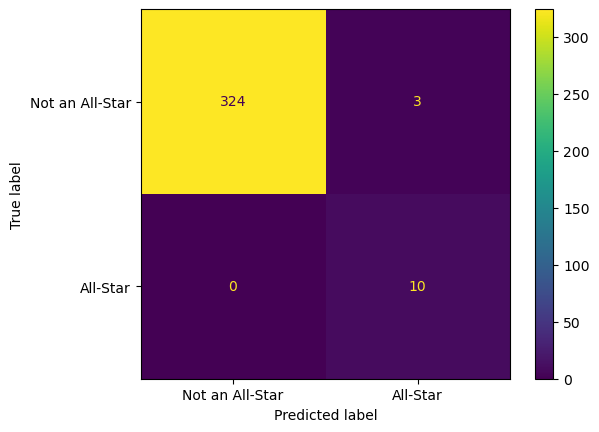

In [144]:
cMatrix = metrics.confusion_matrix(testY4Actual,predictions)
cMDisplay = metrics.ConfusionMatrixDisplay(confusion_matrix=cMatrix, display_labels=['Not an All-Star','All-Star'])
cMDisplay.plot()
plt.show()

In [151]:
accuracy = metrics.accuracy_score(testY4Actual,predictions)*100
precision = metrics.precision_score(testY4Actual,predictions)*100
recall = metrics.recall_score(testY4Actual,predictions)*100
specificity = metrics.recall_score(testY4Actual,predictions,pos_label=0)*100

In [152]:
print(f'{accuracy}% of samples accurately predicted')
print(f'{precision}% of positive predicted samples are positive')
print(f'{recall}% of positive samples were predicted as positive')
print(f'{specificity}% of negative samples were predicted as negative')

99.10979228486647% of samples accurately predicted
76.92307692307693% of positive predicted samples are positive
100.0% of positive samples were predicted as positive
99.08256880733946% of negative samples were predicted as negative


By using sklearn.metrics, we can create a confusion matrix for the test data.

The metrics show that the model does not give false negatives, but can give false positives. This means that our model would likely give all deserving players All-Star berths, but some players who are not deserving may receive berths. This is represented in reality, as replacement players for All-Star games are chosen every year, including mandatory team representatives. These players may not be as good as others, so it is likely that this model is accounting for that.

In [150]:
prunedAdvBatting = advancedBatting.loc[(advancedBatting['Pos Summary'] != '1') & (advancedBatting['Pos Summary'] != '/1')]
prunedAdvBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,Rpos,RAA,WAA,Rrep,RAR,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional,isAllStar
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,-10,9,1.2,23,33,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02,False
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,-3,-18,-1.9,9,-9,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01,False
5,6,Cristhian Adames#,23,COL,26,58,-3,-1,1,1,1,-1,-0.1,2,1,0.1,0.495,0.499,-0.1,0.2,0,81450,Amateur Free Agent,6H/4,adamecr01,False
7,8,Matt Adams*,26,STL,60,186,-6,-1,2,2,-2,-5,-0.6,6,1,0.0,0.491,0.497,-0.2,0.0,-1,534000,Amateur Draft,3H,adamsma01,False
9,10,Ehire Adrianza#,25,SFG,52,134,-6,0,0,3,2,-2,-0.3,4,2,0.2,0.495,0.499,-0.2,0.5,-1,162901,Amateur Free Agent,46H/35,adriaeh01,False
11,12,Jesús Aguilar,25,CLE,7,20,0,0,0,-2,-1,-3,-0.3,1,-2,-0.2,0.458,0.498,0.0,-0.3,0,21929,Amateur Free Agent,/3DH,aguilje01,False
12,13,Nick Ahmed,25,ARI,134,459,-17,-1,1,8,6,-3,-0.4,15,12,1.1,0.498,0.498,0.2,1.5,4,508500,Traded,*6/H,ahmedni01,False
15,16,Hanser Alberto,22,TEX,41,104,-7,1,0,5,1,0,0.0,4,3,0.4,0.499,0.500,-0.2,0.7,-2,128441,Amateur Free Agent,4/65HD,alberha01,False
17,18,Arismendy Alcántara#,23,CHC,11,32,-3,1,0,-2,0,-4,-0.4,1,-3,-0.3,0.462,0.497,-0.1,-0.2,-1,510000,Amateur Free Agent,/4H5,alcanar01,False
20,21,Abraham Almonte#,26,2TM,82,258,-4,0,0,2,1,-1,0.0,9,8,0.8,0.499,0.500,0.6,0.3,6,256882,Traded,8/H,almonab01,False


In [153]:
prunedAdvBatting = prunedAdvBatting.loc[prunedAdvBatting['PA'] >= 162]
prunedAdvBatting

,Rk,Name,Age,Tm,G,PA,Rbat,Rbaser,Rdp,Rfield,Rpos,RAA,WAA,Rrep,RAR,WAR,waaWL%,162WL%,oWAR,dWAR,oRAR,Salary,Acquired,Pos Summary,Name-additional,isAllStar
2,3,José Abreu,28,CHW,154,668,26,-3,-1,-3,-10,9,1.2,23,33,3.5,0.506,0.506,3.7,-1.3,36,8666000,Amateur Free Agent,*3D,abreujo02,False
4,5,Dustin Ackley*,27,2TM,108,264,-2,-2,1,-13,-3,-18,-1.9,9,-9,-1.0,0.482,0.491,0.4,-1.6,4,2600000,Traded,7H84/3D9,ackledu01,False
7,8,Matt Adams*,26,STL,60,186,-6,-1,2,2,-2,-5,-0.6,6,1,0.0,0.491,0.497,-0.2,0.0,-1,534000,Amateur Draft,3H,adamsma01,False
12,13,Nick Ahmed,25,ARI,134,459,-17,-1,1,8,6,-3,-0.4,15,12,1.1,0.498,0.498,0.2,1.5,4,508500,Traded,*6/H,ahmedni01,False
20,21,Abraham Almonte#,26,2TM,82,258,-4,0,0,2,1,-1,0.0,9,8,0.8,0.499,0.500,0.6,0.3,6,256882,Traded,8/H,almonab01,False
22,23,Yonder Alonso*,28,SDP,103,402,4,-1,-1,10,-5,6,0.6,13,19,1.9,0.507,0.504,0.8,0.5,9,1650000,Traded,3/H5,alonsyo01,False
24,25,Jose Altuve,25,HOU,154,689,19,-4,-1,-5,4,14,1.7,23,38,4.0,0.510,0.509,4.5,0.1,42,2500000,Amateur Free Agent,*4/D,altuvjo01,True
29,30,Pedro Álvarez*,28,PIT,150,491,6,0,2,-14,-6,-13,-1.5,16,3,0.1,0.491,0.491,1.6,-2.2,17,5750000,Amateur Draft,*3H/D,alvarpe01,False
31,32,Alexi Amarista*,26,SDP,118,357,-22,2,1,2,5,-13,-1.5,12,-1,-0.4,0.488,0.491,-0.6,0.7,-3,1150000,Traded,6H47/851,amarial01,False
37,38,Elvis Andrus,26,TEX,160,661,-14,3,0,-5,9,-7,-0.6,24,16,1.8,0.495,0.495,2.2,0.5,21,15000000,Traded,*6,andruel01,False


To see if we can further improve the metrics of this model, we can prune advancedBatting to only include players who would have a realistic chance of making the All-Star game byt removing pitchers and players who do not have enough plate appearances.

To remove pitchers we can look at 'Pos Summary', as pitchers are denoted by '1' and '/1', as this is the code for pitchers in baseball scorekeeping.

To remove players with limited playing time, we can remove players who do not have 1 plate apperance per team game, meaning a player needs at least 162 PA, roughly equal to 50 full games.


/var/folders/b7/hbtzj39j4tng96ln0jphxwzr0000gn/T/ipykernel_77491/650304418.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  prunedCorr = prunedAdvBatting.corr()


<Axes: title={'center': 'Pruned Advanced Batting Correlation Heatmap (No Pitchers, min. 162 PA)'}>

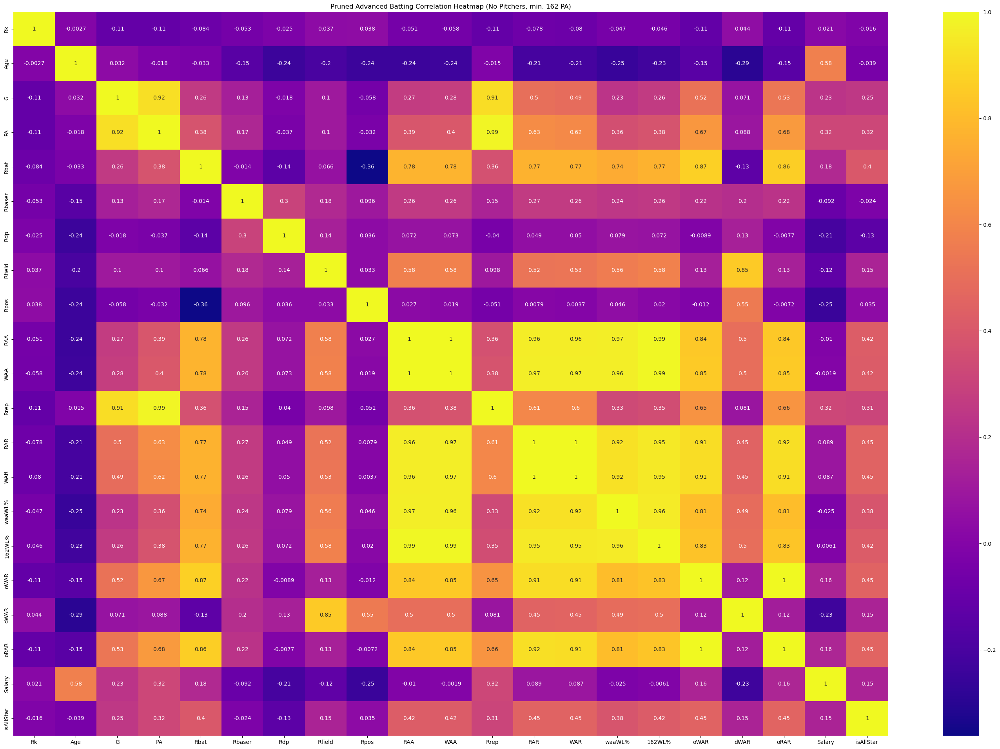

In [156]:
prunedCorr = prunedAdvBatting.corr()
plt.figure(figsize=(36,24))
plt.title('Pruned Advanced Batting Correlation Heatmap (No Pitchers, min. 162 PA)')
sns.heatmap(prunedCorr,cmap='plasma',annot=True)

By creating a heatmap for the pruned dataframe, we can see that the correlations are about the same as the full dataframe.

# Creating final model

To create the final models, we will create functions to allow us to run a model with one function call.

In [157]:
def splitData(dataframeSample,features):
    target = ["isAllStar"]
    X = dataframeSample[features]
    y = dataframeSample[target]
    
    return X,y

In [181]:
def createTree(X, y):
    tree = DecisionTreeClassifier()
    tree.fit(X.values,y)
    
    return tree

In [159]:
def plotTree(decisionTree,features):
    plt.figure(figsize=(40,40))
    plt.title("All-Star Prediction Model Decision Tree")
    tree.plot_tree(decisionTree,feature_names = features, filled = True)

In [182]:
def testTree(decisionTree,test):
    predictions = []
    
    for _,player in test.iterrows():
        predictions.append(
            decisionTree.predict([[
                player["oRAR"],
                player["Rbaser"],
                player["Rdp"],
                player["oWAR"],
                player["WAA"]
            ]])
        )
        
    return np.array(predictions)

In [162]:
def plotConfusionMatrix(actual,predicted):
    cMatrix = metrics.confusion_matrix(actual,predicted)
    cMDisplay = metrics.ConfusionMatrixDisplay(confusion_matrix=cMatrix, display_labels=['Not an All-Star','All-Star'])
    cMDisplay.plot()
    plt.show()

In [172]:
def getMetrics(actual,predicted):
    accuracy = metrics.accuracy_score(actual,predicted)*100
    precision = metrics.precision_score(actual,predicted)*100
    recall = metrics.recall_score(actual,predicted)*100
    specificity = metrics.recall_score(actual,predicted,pos_label=0)*100
    
    print(f'{accuracy}% of samples accurately predicted')
    print(f'{precision}% of positive predicted samples are positive')
    print(f'{recall}% of positive samples were predicted as positive')
    print(f'{specificity}% of negative samples were predicted as negative')

In [175]:
def decisionTreeModel(dataframe,features = ["oRAR", "Rbaser", "Rdp", "oWAR", "WAA"]):
    trainX, trainY = splitData(dataframe.sample(frac = 0.75), features)
    tree = createTree(trainX,trainY)
    
    plotTree(tree,features)
    
    testX, testY = splitData(dataframe.sample(frac = 0.25), features)
    predicted = testTree(tree,testX)
    
    plotConfusionMatrix(testY,predicted)
    getMetrics(testY,predicted)
    

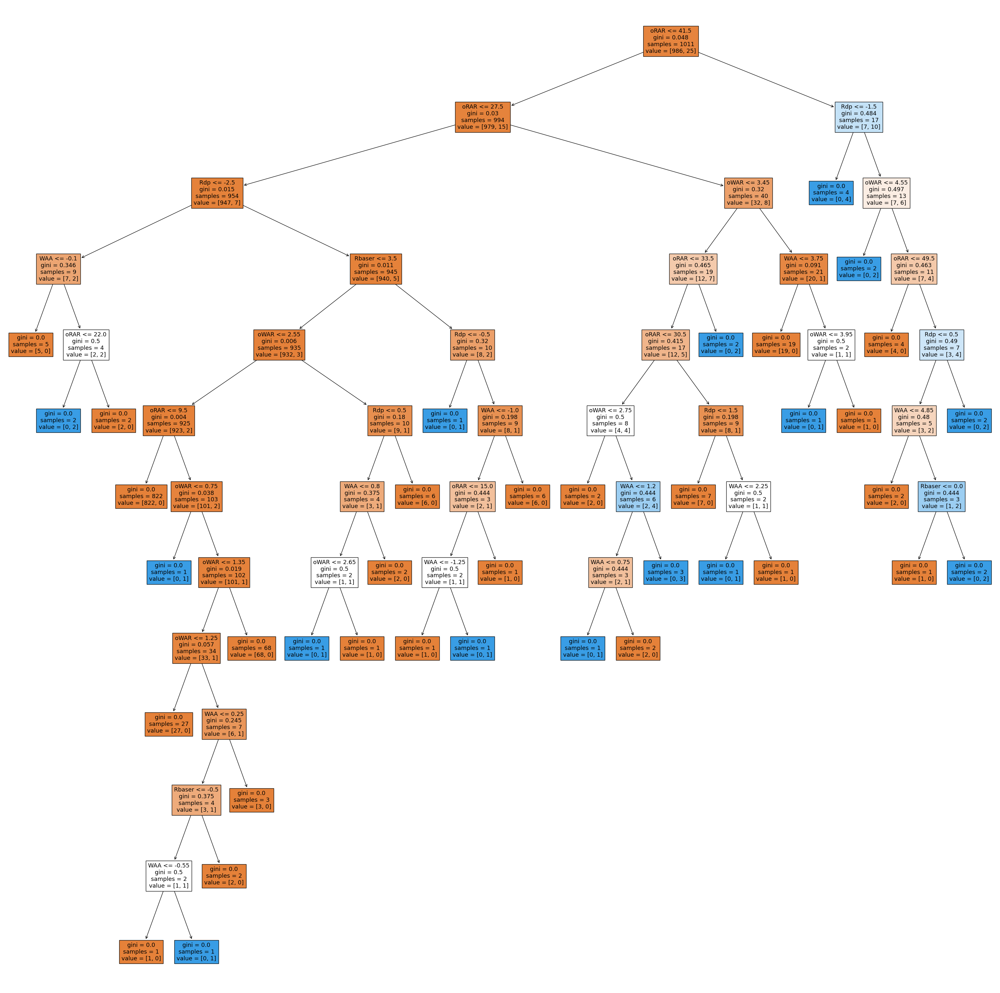

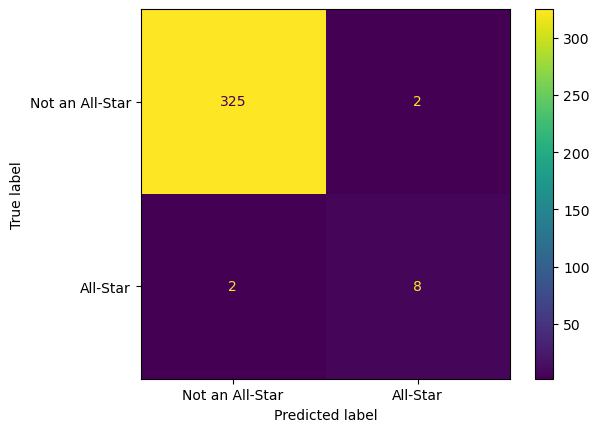

98.81305637982196% of samples accurately predicted
80.0% of positive predicted samples are positive
80.0% of positive samples were predicted as positive
99.38837920489296% of negative samples were predicted as negative


In [183]:
decisionTreeModel(advancedBatting)

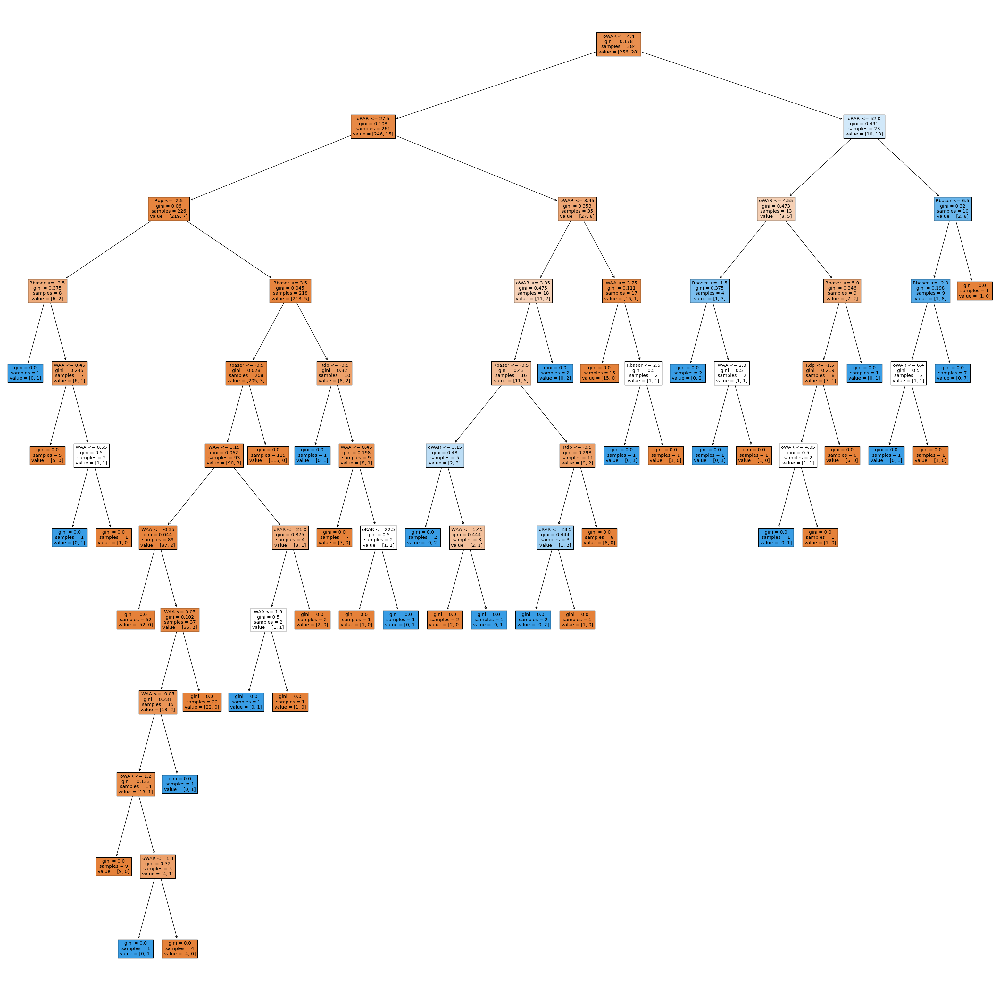

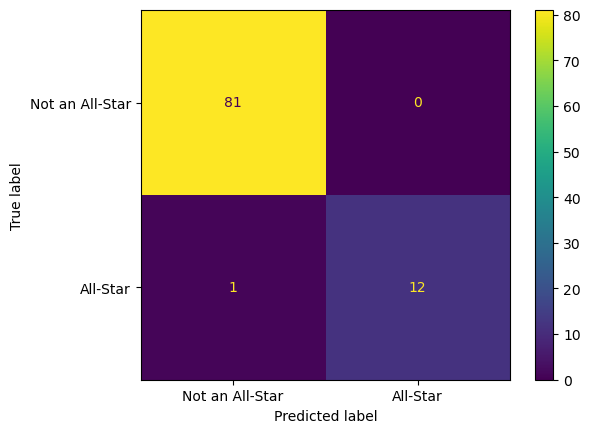

98.93617021276596% of samples accurately predicted
100.0% of positive predicted samples are positive
92.3076923076923% of positive samples were predicted as positive
100.0% of negative samples were predicted as negative


In [184]:
decisionTreeModel(prunedAdvBatting)

By creating and running a model on the full and pruned dataframes, we can see that pruning the dataframe gives better results. The pruned model only has one false negative; the full model has two false negatives and two false positives. 